# 신경망 딥러닝



딥러닝은 머신러닝의 한 방법.

신경망 모델 중에서 층을 많이 활용한 모델이 딥 러닝이다.

따라서, 심층 신경망(DNN)이라고도 불린다.

즉, 깊은 층으로 이루어진 신경말 모델

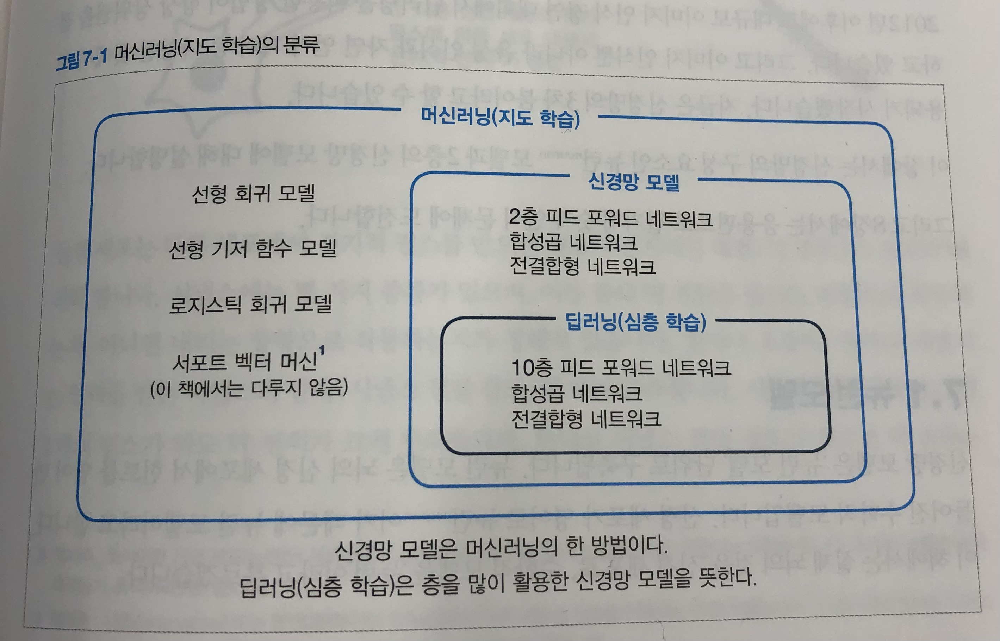

## 7.1 뉴런 모델(신경망 모델)

뇌의 신경 세포(뉴런)에서 힌트를 얻어 만들었다.

### 7.1.1 신경세포
축삭 이라는 케이블을 통해 전기적 펄스가 이동하고, 시냅스의 종류와 상태(전달 강도)로 세기와 방향을 조정한다.

### 7.1.2 뉴런 모델
뉴런 모델은 신경 세포의 움직임을 단순화한 수학적 모델이다.

- 뉴런에 2개의 입력 x=(x0,x1)가 들어오는 것을 가정한다.

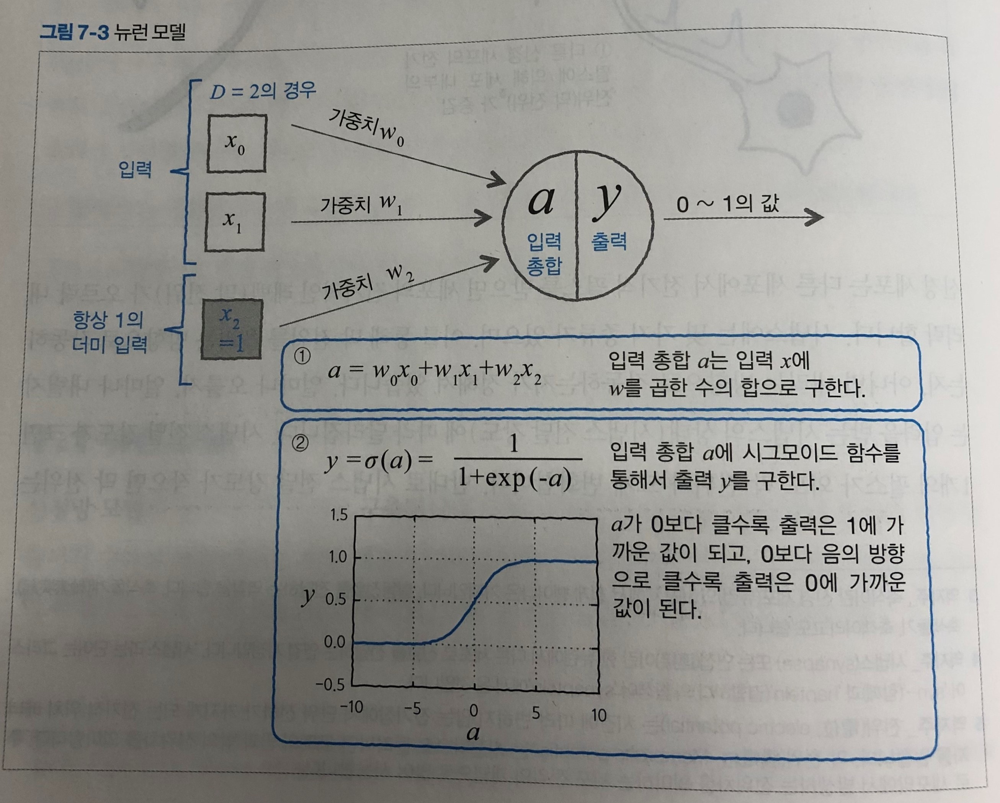

x0,x1: 입력 값, 양수와 음수 값을 갖는 실수

w0,w1: 입력에 대한 시냅스 전달 강도, 가중치

a: 입력 총합(막 전위), w0x0+w1x1+*w2x2*

w2: 절편(바이어스) * x2: 더미 입력

y는 0~1까지 연속된 값을 갖는다. <- a를 시그모이드 함수에 적용한 결과


### 7.2.2 2층 피드 포워드 신경망의 구현


---

소프트맥스 함수 성질

- 함수의 출력은 0~1 사이다.
- 출력의 총합이 1이다.
- 따라서 출력을 확률로 해석하여 분류 문제에 적용할 수 있다.

In [1]:
#-- 리스트 7-1-(1)
import numpy as np
# 데이터 생성 --------------------------------
np.random.seed(seed=1) # 난수를 고정
N = 200 # 데이터의 수
K = 3 # 분포의 수
T = np.zeros((N, 3), dtype=np.uint8)    # 3클래스 분류 
X = np.zeros((N, 2))    # 2차원
X_range0 = [-3, 3] # X0의 범위, 표시용
X_range1 = [-3, 3] # X1의 범위, 표시용
Mu = np.array([[-.5, -.5], [.5, 1.0], [1, -.5]]) # 분포의 중심
Sig = np.array([[.7, .7], [.8, .3], [.3, .8]]) # 분포의 분산
Pi = np.array([0.4, 0.8, 1]) # 각 분포에 대한 비율
for n in range(N):
    wk = np.random.rand()
    for k in range(K):
        if wk < Pi[k]:
            T[n, k] = 1
            break
    for k in range(2):
        X[n, k] = np.random.randn() * Sig[T[n, :] == 1, k] + \
        Mu[T[n, :] == 1, k]

 6강에서  2차원 입력 3클래스 분류 로지스틱 회귀 모델에 사용한 데이터와 동일

In [2]:
#-- 리스트 7-1-(2)
# -------- 2 분류 데이터를 테스트 훈련 데이터로 분할
TestRatio = 0.5
X_n_training = int(N * TestRatio)
X_train = X[:X_n_training, :]
X_test = X[X_n_training:, :]
T_train = T[:X_n_training, :]
T_test = T[X_n_training:, :]


# -------- 데이터를 'class_data.npz'에 저장
np.savez('class_data.npz', X_train=X_train, T_train=T_train,
         X_test=X_test, T_test=T_test,
         X_range0=X_range0, X_range1=X_range1)

생성한 데이터를 훈련 데이터 (X_train, Y_Train)와 테스트 데이터 (X_test, Y_test) 나눈다.

오버 피팅 확인을 위함.

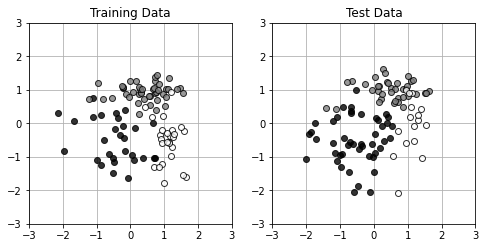

In [3]:
#-- 리스트 7-1-(3)
import matplotlib.pyplot as plt
%matplotlib inline


# 데이터를 그리기 ------------------------------
def Show_data(x, t):
    wk, n = t.shape
    c = [[0, 0, 0], [.5, .5, .5], [1, 1, 1]]
    for i in range(n):
        plt.plot(x[t[:, i] == 1, 0], x[t[:, i] == 1, 1],
                 linestyle='none',
                 marker='o', markeredgecolor='black',
                 color=c[i], alpha=0.8)
    plt.grid(True)


# 메인 ------------------------------------
plt.figure(1, figsize=(8, 3.7))
plt.subplot(1, 2, 1)
Show_data(X_train, T_train)
plt.xlim(X_range0)
plt.ylim(X_range1)
plt.title('Training Data')
plt.subplot(1, 2, 2)
Show_data(X_test, T_test)
plt.xlim(X_range0)
plt.ylim(X_range1)
plt.title('Test Data')
plt.show()

만든 데이터 시각화 Show_data(x, t)
훈련 데이터도 테스트 데이터에서 공통으로 사용할 수 있도록 함.

### 2층 피드 포워드 신경망 네트워크 구축 & 3클래스 분류 문제가 풀릴 것인지 확인
FNN: 2층 피드 포워드 신경망 정의 함수

FNN은 입력 x를 받아 y를 출력

x: D차원 벡터

y: K차원 벡터

D = 2, K = 3 으로 가정

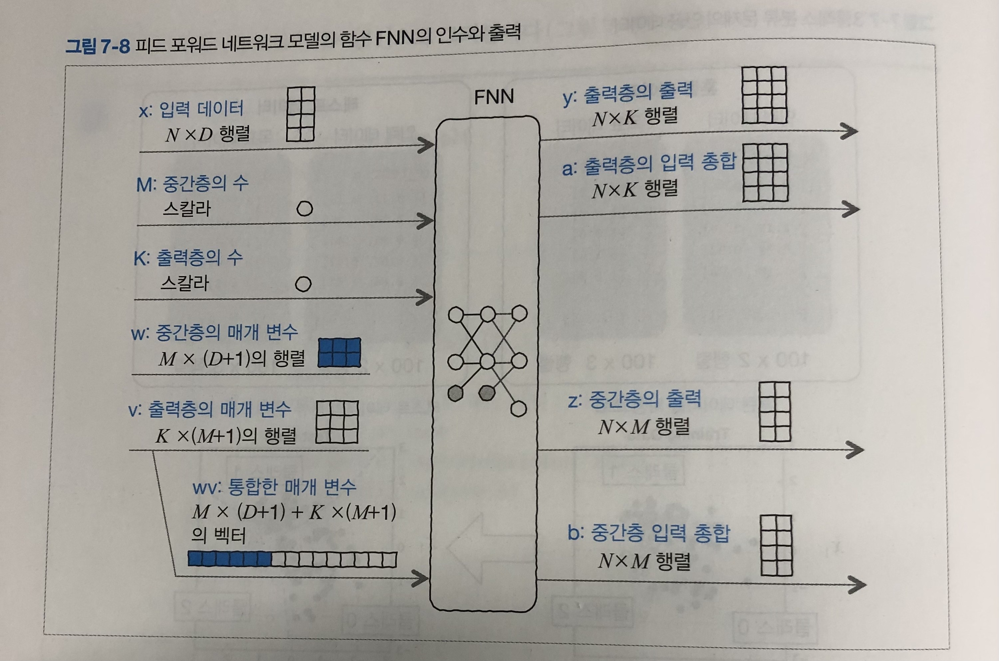

FNN은 N개의 데이터를 한꺼번에 처리할 수 있도록 설계

x: 데이터 수 N x D 차원 행렬

y: 데이터 수 N x K 차원 행렬

y[n, 0], y[n, 1], y[n,2] 는 x[n, :]이 클래스 0,1,2에 속해 있을 가능성을 나타낸다.

모두 더하면 1이 되는 제약이 있다. 소트트맥스

중간층의 수와 출력의 차원도 자유롭게 바꿀 수 있다. 각각 M, K 를 네트워크의 인수로 한다.

W: 중간층 가중치

V: 출력층 가중치

W,V는 네트워크의 동작을 결정하는 중요한 매개 변수이다. 네트워크에 전달

W: M x (D+1) 행렬  바이어스 수 +1

V: K x (M+1) 행렬

wv: W와 V를 한 덩어리 벤터

wv의 길이는 M x (D+1) + K x (M+1)

FNN의 출력
 - y: N개의 데이터에 대응한 출력 NxK
 - z: 중간층 출력 z
 - a, b: 출력층과 중간층의 입력 총합

In [4]:
# 리스트 7-1-(4)
# 시그모이드 함수 ------------------------
def Sigmoid(x):
    y = 1 / (1 + np.exp(-x))
    return y


# 네트워크 ------------------------
def FNN(wv, M, K, x):
    N, D = x.shape # 입력 차원
    w = wv[:M * (D + 1)] # 중간층 뉴런의 가중치
    w = w.reshape(M, (D + 1))
    v = wv[M * (D + 1):] # 출력층 뉴런의 가중치
    v = v.reshape((K, M + 1))
    b = np.zeros((N, M + 1)) # 중간층 뉴런의 입력 총합
    z = np.zeros((N, M + 1)) # 중간층 뉴런의 출력
    a = np.zeros((N, K)) # 출력층 뉴런의 입력 총합
    y = np.zeros((N, K)) # 출력층 뉴런의 출력
    for n in range(N):
        # 중간층의 계산
        for m in range(M):
            b[n, m] = np.dot(w[m, :], np.r_[x[n, :], 1]) # (A) 더미 입력 덧 붙인 것   np.r_[A, B] 행렬을 옆으로 연결시키는 명령어
            z[n, m] = Sigmoid(b[n, m])
        # 출력층의 계산
        z[n, M] = 1 # 더미 뉴런
        wkz = 0
        for k in range(K):
            a[n, k] = np.dot(v[k, :], z[n, :])
            wkz = wkz + np.exp(a[n, k])
        for k in range(K):
            y[n, k] = np.exp(a[n, k]) / wkz
    return y, a, z, b


# test ---
WV = np.ones(15)
M = 2
K = 3
FNN(WV, M, K, X_train[:2, :])

(array([[0.33333333, 0.33333333, 0.33333333],
        [0.33333333, 0.33333333, 0.33333333]]),
 array([[2.6971835 , 2.6971835 , 2.6971835 ],
        [1.49172649, 1.49172649, 1.49172649]]),
 array([[0.84859175, 0.84859175, 1.        ],
        [0.24586324, 0.24586324, 1.        ]]),
 array([[ 1.72359839,  1.72359839,  0.        ],
        [-1.12079826, -1.12079826,  0.        ]]))

### 7.2.3 수치 미분법
2층 피드 포워드 네트워크 (FNN) 에서 3분류 문제 풀기를 생각해보자

우선, 분류 문제이므로 오차 함수는 평균 교차 엔트로피 오차 사용

CE_FNN: 평균 교차 엔트로피 오차

In [5]:
# 리스트 7-1-(5)
# 평균 교차 엔트로피 오차 ---------
def CE_FNN(wv, M, K, x, t):
    N, D = x.shape
    y, a, z, b = FNN(wv, M, K, x)
    ce = -np.dot(np.log(y.reshape(-1)), t.reshape(-1)) / N
    return ce


# test ---
WV = np.ones(15)
M = 2
K = 3
CE_FNN(WV, M, K, X_train[:2, :], T_train[:2, :])

1.0986122886681098

CE_FNN은 FNN과 마찬가지로 wv를 입력

네트워크 크기 결정하는 M과 K, 입력데이터 x와 목표 데이터 t를 입력

-> 내부에서 FNN이 x에 대한 y를 출력하고, y와 t를 비교하여 크로스 엔트로피가 계산된다. 

경사 하강법을 적용하려면 오차 함수를 매개 변수로 편미분한 식이 필요하다.

그런데, 미분 계산을 대충하고, 계산 속도를 신경쓰지 않는다면 간단하게 수치적 미분한 것과 같은 값을 구할 수 있다.

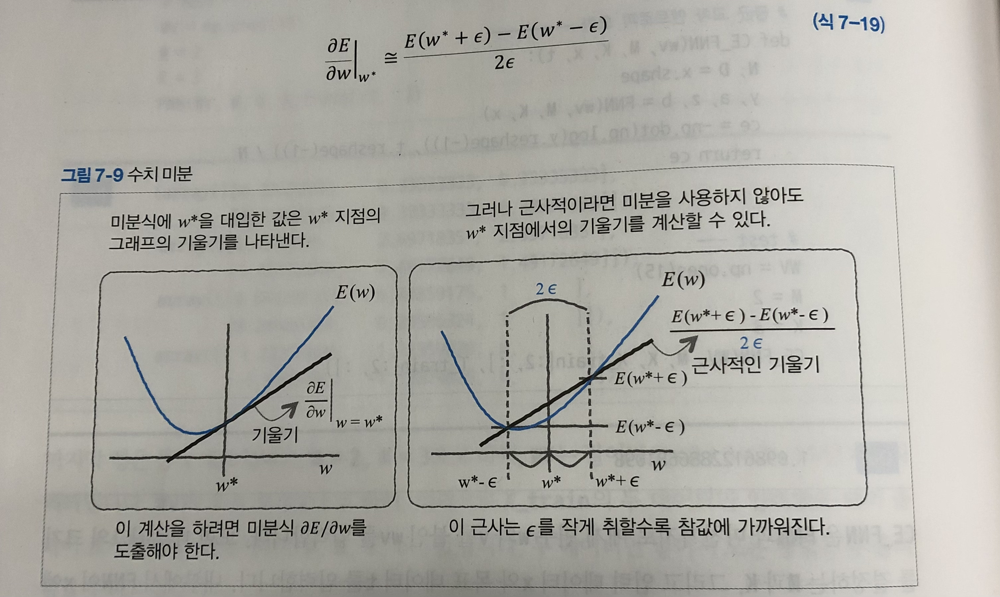

구하려는 w*에서 조금 앞의 w*-e와 조금 앞선 w*+e 지점을 구하여 기울기를 구한다면 w*의 기울기를 근사할 수 있다.

그런데, 실제로 매개 변수는 하나가 아니라 여러개이므로 구하고자 하는 w0* 외에 매개 변수를 고정하여 기울기를 구하는 과정을 매개 변수 개수만큼 반복해야한다.

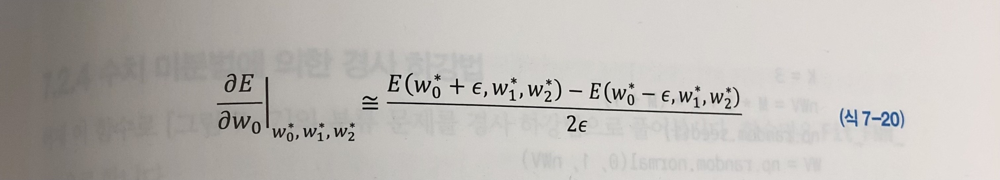

이 방법은 근사이지만 e를 충분히 작게 취하는 것으로, 실제 값에 충분히 가까워진다고 여길 수 있다.

띠라서, 이 방법의 단점은 정밀도의 오차보다는 계산 비용에 있다.

한 매개 변수 당 두 번의 E 계산이 필요하기 때문이다.

[ 0.0884813   0.19157999 -0.05139799  0.01281536 -0.14468029 -0.14242768
 -0.02992012  0.01351315 -0.11115648 -0.10104422 -0.09427964 -0.46855603
  0.13096434  0.08076649  0.57971252]


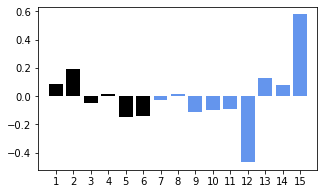

In [6]:
# 리스트 7-1-(6)
# - 수치 미분 ------------------
def dCE_FNN_num(wv, M, K, x, t):
    epsilon = 0.001
    dwv = np.zeros_like(wv)
    for iwv in range(len(wv)):
        wv_modified = wv.copy()
        wv_modified[iwv] = wv[iwv] - epsilon
        mse1 = CE_FNN(wv_modified, M, K, x, t)
        wv_modified[iwv] = wv[iwv] + epsilon
        mse2 = CE_FNN(wv_modified, M, K, x, t)
        dwv[iwv] = (mse2 - mse1) / (2 * epsilon)
    return dwv


#--dVW의 표시 ------------------
def Show_WV(wv, M):
    N = wv.shape[0]
    plt.bar(range(1, M * 3 + 1), wv[:M * 3], align="center", color='black')
    plt.bar(range(M * 3 + 1, N + 1), wv[M * 3:],
            align="center", color='cornflowerblue')
    plt.xticks(range(1, N + 1))
    plt.xlim(0, N + 1)


#-test----
M = 2
K = 3
nWV = M * 3 + K * (M + 1)
np.random.seed(1)
WV = np.random.normal(0, 1, nWV)
dWV = dCE_FNN_num(WV, M, K, X_train[:2, :], T_train[:2, :])
print(dWV)
plt.figure(1, figsize=(5, 3))
Show_WV(dWV, M)
plt.show()

### 7.2.4 수치 미분법에 의한 경사 하강법
이제 경사 하강법으로 풀어보자.

**Fit_FNN_num(wv_init, M, K, x_train, t_train, x_test, t_test, n, alpha)**

앞선 방법과 다른 부분은 입력에 학습시키는 가중치의 초기값으로 wv_init을 넣는 것이다.

또한, 훈련 데이터뿐만 아니라 테스트 데이터도 입력한다.

학습 단계별로 테스트 데이터의 오차도 체크해 오버 피팅을 확인하기 위함이다.

물론, 테스트 데이터의 정보는 매개 변수 학습에 사용하지 않는다.

In [7]:
# 리스트 7-1-(7)
import time


# 수치 미분을 사용한 구배법 -------
def Fit_FNN_num(wv_init, M, K, x_train, t_train, x_test, t_test, n, alpha):
    wvt = wv_init
    err_train = np.zeros(n)
    err_test = np.zeros(n)
    wv_hist = np.zeros((n, len(wv_init)))
    epsilon = 0.001
    for i in range(n): # (A)
        wvt = wvt - alpha * dCE_FNN_num(wvt, M, K, x_train, t_train)
        err_train[i] = CE_FNN(wvt, M, K, x_train, t_train)
        err_test[i] = CE_FNN(wvt, M, K, x_test, t_test)
        wv_hist[i, :] = wvt
    return wvt, wv_hist, err_train, err_test


# 메인 ---------------------------
startTime = time.time()
M = 2
K = 3
np.random.seed(1)
WV_init = np.random.normal(0, 0.01, M * 3 + K * (M + 1))
N_step = 1000 # (B) 학습 단계
alpha = 0.5
WV, WV_hist, Err_train, Err_test = Fit_FNN_num(
    WV_init, M, K, X_train, T_train, X_test, T_test, N_step, alpha)
calculation_time = time.time() - startTime
print("Calculation time:{0:.3f} sec".format(calculation_time))

Calculation time:170.608 sec


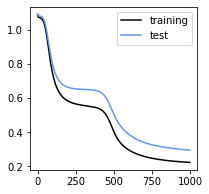

In [8]:
# 리스트 7-1-(8)
# 학습 오차의 표시 ---------------------------
plt.figure(1, figsize=(3, 3))
plt.plot(Err_train, 'black', label='training')
plt.plot(Err_test, 'cornflowerblue', label ='test')
plt.legend()
plt.show()

훈련 데이터의 오차가 단조롭게 감소하여 일정한 값으로 수렴한다면 학습 프로그램이 잘 작동하는 것이다.

학습에 사용하지 않은 테스트 데이터의 오차도 도중에 오르지 않고 단순하게 떨어지고 있다면 오버 피팅이 발생하지 않은 것이다.

그래프를 보면, 400단계 부근에서 학습이 수렴한 것처럼 보이다가, 급격히 학습이 진행된다.

살펴보자

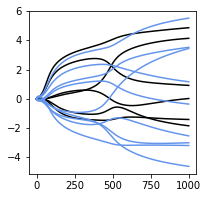

In [9]:
# 리스트 7-1-(9)
# 가중치의 시간 변화의 표시 ---------------------------
plt.figure(1, figsize=(3, 3))
plt.plot(WV_hist[:, :M * 3], 'black')
plt.plot(WV_hist[:, M * 3:], 'cornflowerblue')
plt.show()

가중치는 각각 특정 값으로 서서히 수렴하고 있다가 400단계 부근에서 각각의 가중치 그래프가 교차하고 있다.

이것은 가중치를 갱신하는 방향, 즉 오차 함수의 기울기의 방향이 변화하는 것을 의미한다.

이는, 가중치가 안장점이라는 지점 근처를 통과했기 때문일 수 있다.

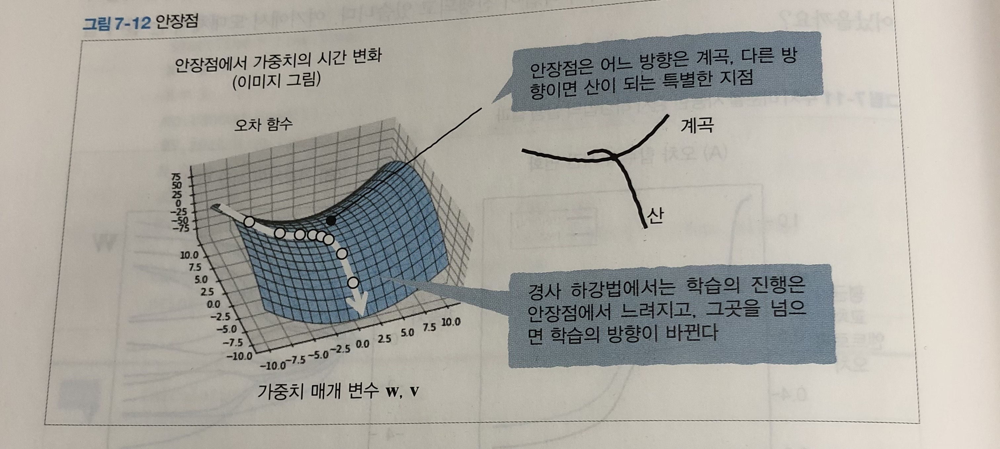

안장점은 어느 방향은 계곡, 다른 방향으로는 산이 되는 지점이다.

만약 2차원의 가중치 공간에서 알장점 이미지를 그리면 위 그림과 같다.

경사 하강법에 따라 가중치는 계곡의 중심을 향해 나아가고 있지만, 중심에 가까워질수록 기울기는 작아지고, 갱신도 느려진다.

그러나 어느 정도 진행되면 거기에서 점차 방향이 변화하고, 또한 갱신이 가속된다.

신경망에 의해 만들어지는 오차 함수의 지형은 복잡하다.

특히, 비선형성이 강한 신경망의 경우는 학습이 수렴했다고 생각해도, 더 노력하면 학습이 단숨에 진행되는 경우가 많다.

따라서, 신경망의 학습 단계 수를 결정하는 것은 상당히 어려운 문제이다.

오차와 가중치만으로는 네트워크가 정말로 학습했다는 실감이 나지 않는다.

그래서, 데이터 공간을 클래스로 판정하는 영역의 경계선을 살펴보자.

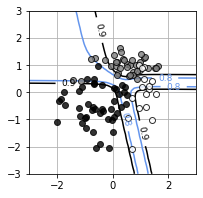

In [15]:
# 리스트 7-1-(10)
# 경계선 표시 함수 --------------------------
def show_FNN(wv, M, K):
    xn = 60 # 등고선 표시 해상도
    x0 = np.linspace(X_range0[0], X_range0[1], xn)
    x1 = np.linspace(X_range1[0], X_range1[1], xn)
    xx0, xx1 = np.meshgrid(x0, x1)
    x = np.c_[np.reshape(xx0, xn * xn, 'F'), np.reshape(xx1, xn * xn, 'F')]   # 1을 F로 수정
    y, a, z, b = FNN(wv, M, K, x)
    plt.figure(1, figsize=(4, 4))
    for ic in range(K):
        f = y[:, ic]
        f = f.reshape(xn, xn)
        f = f.T
        cont = plt.contour(xx0, xx1, f, levels=[0.8, 0.9],
                           colors=['cornflowerblue', 'black'])
        cont.clabel(fmt='%1.1f', fontsize=9)
    plt.xlim(X_range0)
    plt.ylim(X_range1)
    
    
# 경계선 표시 --------------------------
plt.figure(1, figsize=(3, 3))
Show_data(X_test, T_test)
show_FNN(WV, M, K)
plt.show()

테스트 데이터 상에서도 경게선을 잘 그리는 것을 확인했다.

경계선이 어떻게 나타났는지 궁금하지만, 수치 미분의 이야기는 여기서 일단 끝내도록 한다.

수치 미분은 실행 속도가 느리다.

그래서 편미분을 해석적으로 구하여 실행 속도를 빠르게 해본다.

### 7.2.5 오차 역전파법

FFN에 학습시키는 방법에서 오차 역전파법이 유명하다.

오차 역전파법은 네트워크의 출력에서 발생하는 오차(지도 신호와의 차이)의 정보를 사용하여, 출력층의 가중치 Vkj에서 중간층에 가중치 Wji으로 입력 방향의 반대로 가중치를 갱신해 나간다.

사실 오차 역전파법은 경사 하강법이다. 경사 하강법을 피드 포워드 네트워크에 적용하면 오차 역전파법이 자연스럽게 도출된다.

경사 하강법을 적용하기 위해 오차 함수를 매개 변수로 편미분한다.
네트워크는 클래스 분류를 하기 떄문에 오차 함수는 평균 교차 엔트로피 오차를 생각한다.

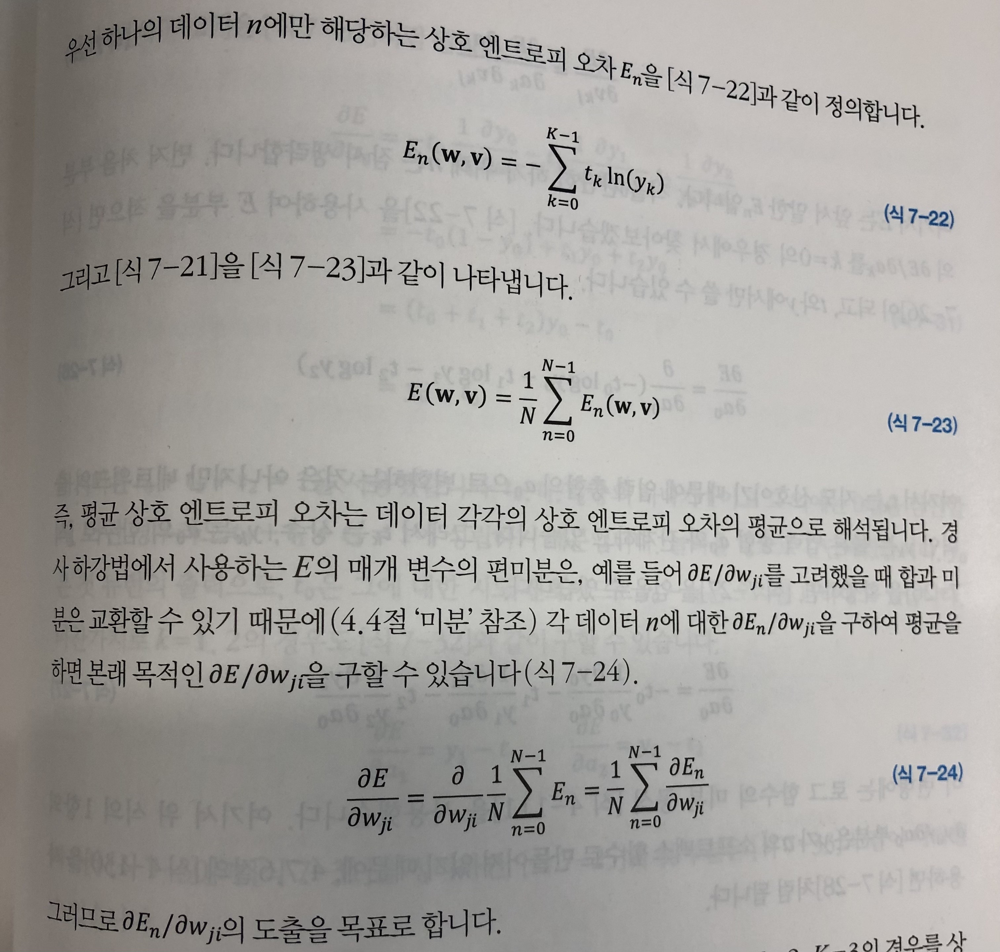

사진 상의 식을 보면,
하나의 데이터 n에만 해당하는 교차 엔트로피 오차를 정의하여 교차 엔트로피 오차 식에 대입하여 본다면, 평균 교차 엔트로피 오차는 데이터 각각의 교차 엔트로피 오차의 평균으로 해석된다.



네트워크 매개 변수는 w뿐만 아니라 v도 있다.

### 7.2.6 E를 v로 편미분한 것 구하기

tk: 지도 신호

편미분 해본다면 식은 다음과 같다

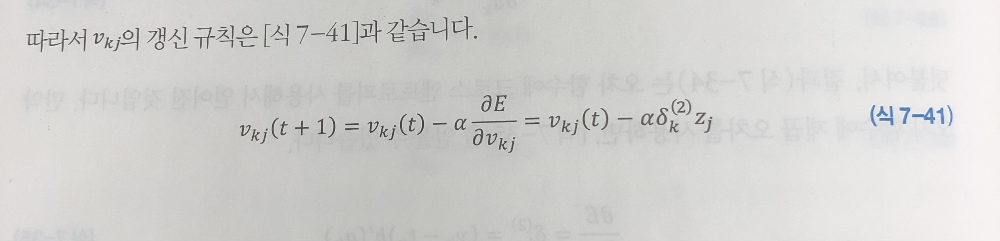

가중치 Vkj는 중간층(1층)의 뉴런 j에서 출력층(2층)의 뉴런 k에 정보를 전달하는 결합의 가중치이다.

식을 해석하면 이 결합의 변경의 크기는 입력 크기 Zj와 그 앞에서 생기는 오차의 곱으로 결정된다는 것이다.

오차는 양수,음수,0도 존재하지만, Zj는 bj의 변화량이므로 항상 0에서 1 사이의 양수 값을 취한다.

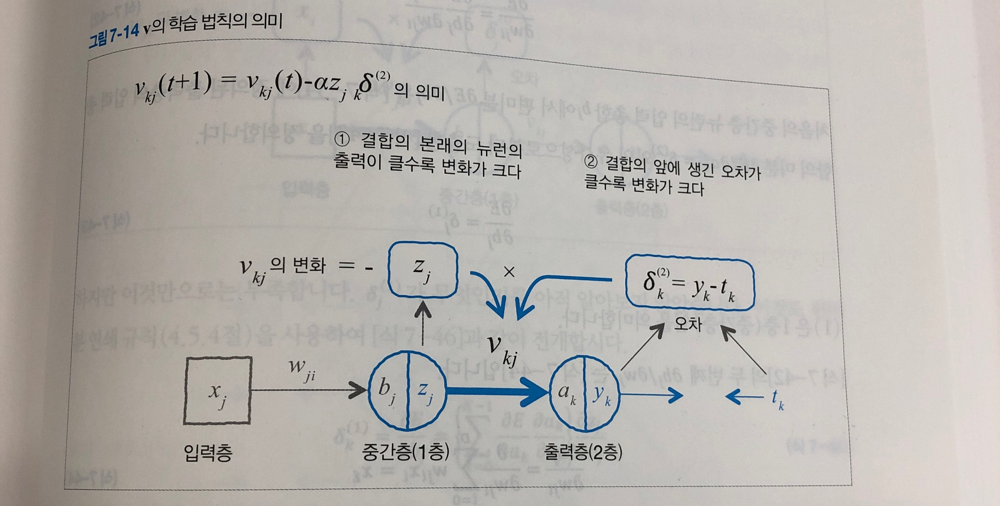

식에 따르면, 출력 yk가 목표 데이터 tk와 일치하는 경우 오차 yk-tk는 0이 되므로, 변경분은 0이 된다.

결과적으로 vkj는 변하지 않는다.

이는 오차가 없으면 결합은 변경할 필요가 없음을 의미한다.

목표 데이터가 0인데 출력이 0보다 크다면, 오차는 양수가 된다.

결과적으로 변경분은 음수가 되고, vkj는 감소하는 방향으로 변경된다.

즉, 출력이 너무 커서 오차가 발생했기 때문에 뉴런 zj의 영향을 줄이는 방향으로 가중치가 변경된다고 해석할 수 있다.

또한 입력 zj이 큰 경우에 결합의 출력에 크게 기여하므로 vkj의 변화량도 그만큼 커지고 있다고도 해석할 수 있다.

### 7.4.6 E를 w로 편미분 한 것 구하기

w 또한 계산해보면 v를 편미분 한 것과 같은 식이 나온다.

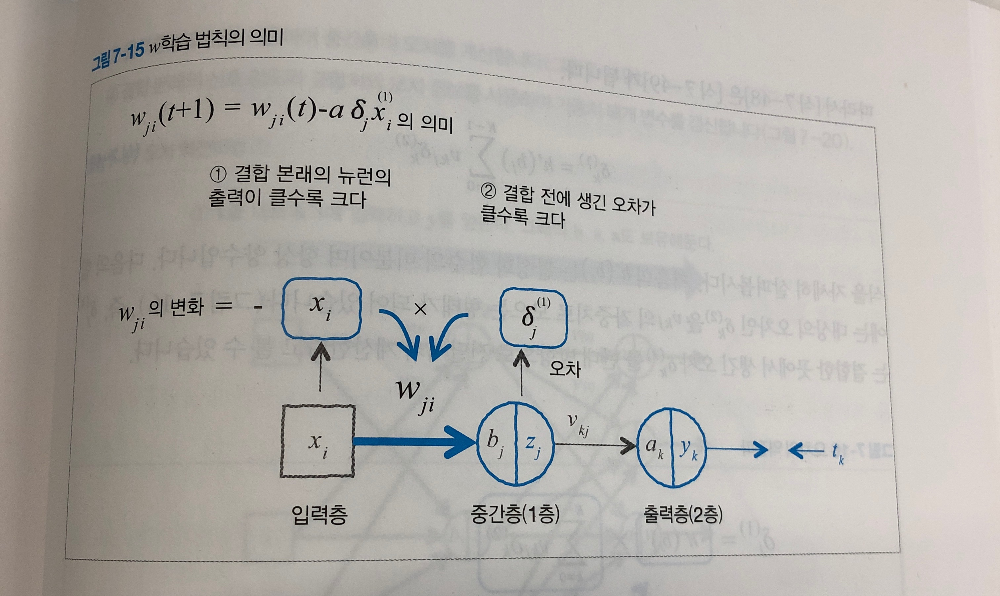

하지만 이것만으로는 1층의 변경분이 뭔지 모른다.

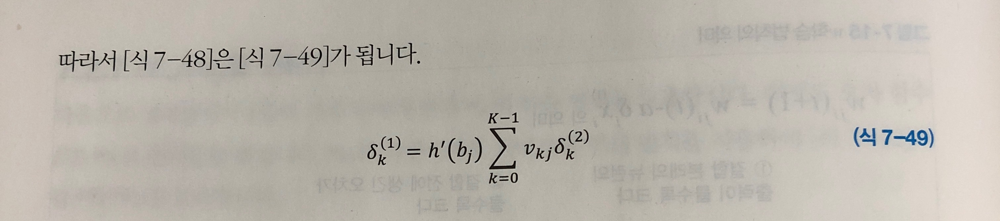

살펴보면, 결합한 곳에서 생긴 오차 변경분(2층)을 반대 방향으로 전달시켜 계산한다고 볼 수 있다.

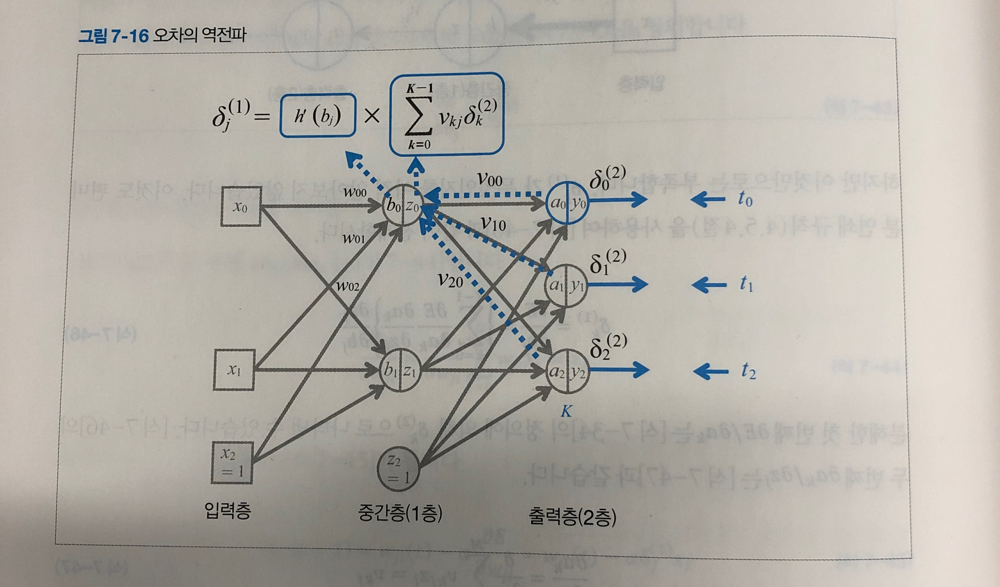

오차 역전파법은 네트워크 계층이 더 늘어도 이 법칙을 사용하여 간단하게 가중치 매개 변수의 학습 법칙을 도출할 수 있다.

이 특성으로 인해 피드 포워드 신경망의 경사 하강법이 오차 역전파법이라고 불린다.

이 일련의 절차는 데이터 하나에 대한 갱신이다.

즉, N개의 데이터가 있으니 위 과정을 N번 처리해 학습의 1단계로 한다.

층이 많아져도 똑같은 형태가 반복된다.

### 7.2.8 오차 역전파법의 구현

함수의 이름은 dCE_FNN

dw: w 편미분

dv: v 편미분

함수의 출력: dwv

analytical dWV
[ 0.08848131  0.19158    -0.051398    0.01281536 -0.14468029 -0.14242768
 -0.02992012  0.01351315 -0.11115649 -0.10104422 -0.09427964 -0.46855604
  0.13096434  0.08076649  0.57971253]
numerical dWV
[ 0.0884813   0.19157999 -0.05139799  0.01281536 -0.14468029 -0.14242768
 -0.02992012  0.01351315 -0.11115648 -0.10104422 -0.09427964 -0.46855603
  0.13096434  0.08076649  0.57971252]


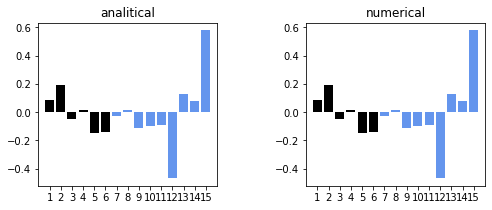

In [16]:
# 리스트 7-1-(11)
# -- 해석적 미분 -----------------------------------
def dCE_FNN(wv, M, K, x, t):
    N, D = x.shape
    # wv을 w와 v로 되돌림
    w = wv[:M * (D + 1)]
    w = w.reshape(M, (D + 1))
    v = wv[M * (D + 1):]
    v = v.reshape((K, M + 1))
    # ① x를 입력하여 y를 얻음
    y, a, z, b = FNN(wv, M, K, x)
    # 출력 변수의 준비
    dwv = np.zeros_like(wv)
    dw = np.zeros((M, D + 1))
    dv = np.zeros((K, M + 1))
    delta1 = np.zeros(M) # 1층 오차
    delta2 = np.zeros(K) # 2층 오차(k = 0 부분은 사용하지 않음)
    for n in range(N): # (A)
        # ② 출력층의 오차를 구하기
        for k in range(K):
            delta2[k] = (y[n, k] - t[n, k])
        # ③ 중간층의 오차를 구하기
        for j in range(M):
            delta1[j] = z[n, j] * (1 - z[n, j]) * np.dot(v[:, j], delta2)
        # ④ v의 기울기 dv를 구하기
        for k in range(K):
            dv[k, :] = dv[k, :] + delta2[k] * z[n, :] / N
        # ④ w의 기울기 dw를 구하기
        for j in range(M):
            dw[j, :] = dw[j, :] + delta1[j] * np.r_[x[n, :], 1] / N
    # dw와 dv를 합체시킨 dwv로 만들기
    dwv = np.c_[dw.reshape((1, M * (D + 1))), \
                dv.reshape((1, K * (M + 1)))]
    dwv = dwv.reshape(-1)
    return dwv


#------Show VW
def Show_dWV(wv, M):
    N = wv.shape[0]
    plt.bar(range(1, M * 3 + 1), wv[:M * 3],
            align="center", color='black')
    plt.bar(range(M * 3 + 1, N + 1), wv[M * 3:],
            align="center", color='cornflowerblue')
    plt.xticks(range(1, N + 1))
    plt.xlim(0, N + 1)
    
    
#-- 동작 확인
M = 2
K = 3
N = 2
nWV = M * 3 + K * (M + 1)
np.random.seed(1)
WV = np.random.normal(0, 1, nWV)


dWV_ana = dCE_FNN(WV, M, K, X_train[:N, :], T_train[:N, :])
print("analytical dWV")
print(dWV_ana)


dWV_num = dCE_FNN_num(WV, M, K, X_train[:N, :], T_train[:N, :])
print("numerical dWV")
print(dWV_num)


plt.figure(1, figsize=(8, 3))
plt.subplots_adjust(wspace=0.5)
plt.subplot(1, 2, 1)
Show_dWV(dWV_ana, M)
plt.title('analitical')
plt.subplot(1, 2, 2)
Show_dWV(dWV_num, M)
plt.title('numerical')
plt.show()

수치 미분으로 풀어본 분류 문제를 오차 역전파법으로 풀어본 것과 비교한 것이다.

해석적 미분값은 수치 미분 값과 거의 일치한다.

계산 과정은 오류 역전파를 N번 반복하고 각 반복에서 얻을 수 있는 모든 dv,dw를 합해 평균을 계싼한다.

In [17]:
# 리스트 7-1-(12)
import time


# 해석적 미분을 사용한 구배법 -------
def Fit_FNN(wv_init, M, K, x_train, t_train, x_test, t_test, n, alpha):
    wv = wv_init.copy()
    err_train = np.zeros(n)
    err_test = np.zeros(n)
    wv_hist = np.zeros((n, len(wv_init)))
    epsilon = 0.001
    for i in range(n):
        wv = wv - alpha * dCE_FNN(wv, M, K, x_train, t_train) # (A)
        err_train[i] = CE_FNN(wv, M, K, x_train, t_train)
        err_test[i] = CE_FNN(wv, M, K, x_test, t_test)
        wv_hist[i, :] = wv
    return wv, wv_hist, err_train, err_test


# 메인 ---------------------------
startTime = time.time()
M = 2
K = 3
np.random.seed(1)
WV_init = np.random.normal(0, 0.01, M * 3 + K * (M + 1))
N_step = 1000
alpha = 1
WV, WV_hist, Err_train, Err_test = Fit_FNN(
    WV_init, M, K, X_train, T_train, X_test, T_test, N_step, alpha)
calculation_time = time.time() - startTime
print("Calculation time:{0:.3f} sec".format(calculation_time))

Calculation time:20.449 sec


수치 미분에 비해 계산은 훨씬 빠르게 끝난다

저자의 경우 수치 미분을 이용한 경사 하강법보다 8.5배 빨라졌다.

제대로 미분할 필요성을 실감할 수 있다.

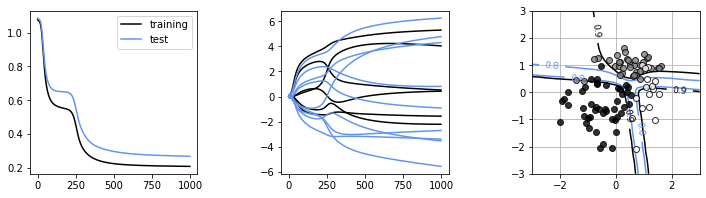

In [18]:
# 리스트 7-1-(13)
plt.figure(1, figsize=(12, 3))
plt.subplots_adjust(wspace=0.5)
# 학습 오차의 표시 ---------------------------
plt.subplot(1, 3, 1)
plt.plot(Err_train, 'black', label='training')
plt.plot(Err_test, 'cornflowerblue', label='test')
plt.legend()
# 가중치의 시간 변화 표시 ---------------------------
plt.subplot(1, 3, 2)
plt.plot(WV_hist[:, :M * 3], 'black')
plt.plot(WV_hist[:, M * 3:], 'cornflowerblue')
# 경계선 표시 --------------------------
plt.subplot(1, 3, 3)
Show_data(X_test, T_test)
M = 2
K = 3
show_FNN(WV, M, K)
plt.show()

수치 미분 떄와 거의 같은 결과이다.


---

네트워크의 규모가 커질 수록 미분 계싼 속도의 중요성은 커진다.

그렇다면, 계싼 속도가 느린 수치 미분은 의미가 없을까? 아니다.

수치 미분은 도출된 미분 방정식이 맞는지 확인하는 강력한 도구가 된다.

### 7.2.9 학습 후 뉴런의 특성

곡선의 경계선을 어떻게 얻었을까?



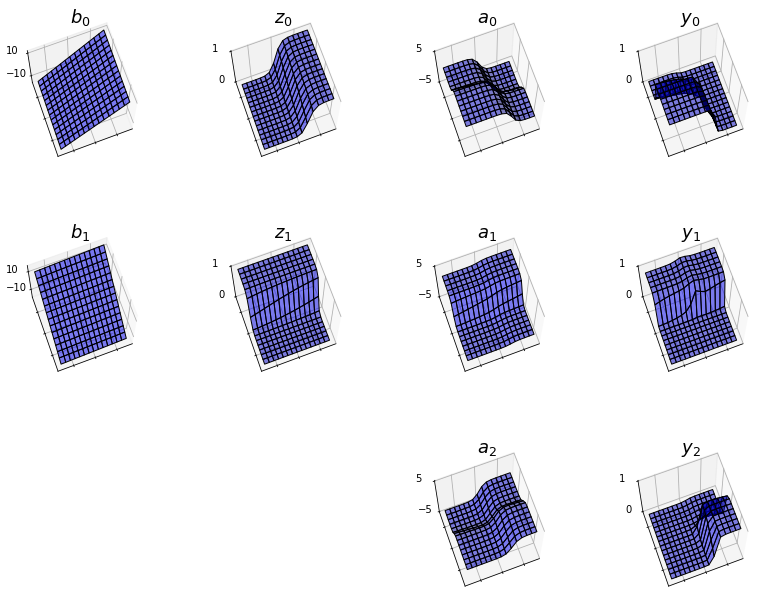

In [20]:
# 리스트 7-1-(14)
from mpl_toolkits.mplot3d import Axes3D


def show_activation3d(ax, v, v_ticks, title_str):
    f = v.copy()
    f = f.reshape(xn, xn)
    f = f.T
    ax.plot_surface(xx0, xx1, f, color='blue', edgecolor='black',
                    rstride=1, cstride=1, alpha=0.5)
    ax.view_init(70, -110)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticks(v_ticks)
    ax.set_title(title_str, fontsize=18)
    
    
M = 2
K = 3
xn = 15 # 등고선 표시 해상도
x0 = np.linspace(X_range0[0], X_range0[1], xn)
x1 = np.linspace(X_range1[0], X_range1[1], xn)
xx0, xx1 = np.meshgrid(x0, x1)
x = np.c_[np.reshape(xx0, xn * xn, 'F'), np.reshape(xx1, xn * xn, 'F')]
y, a, z, b = FNN(WV, M, K, x)


fig = plt.figure(1, figsize=(12, 9))
plt.subplots_adjust(left=0.075, bottom=0.05, right=0.95,
                    top=0.95, wspace=0.4, hspace=0.4)

for m in range(M):
    ax = fig.add_subplot(3, 4, 1 + m * 4, projection='3d')
    show_activation3d(ax, b[:, m], [-10, 10], '$b_{0:d}$'.format(m))
    ax = fig.add_subplot(3, 4, 2 + m * 4, projection='3d')
    show_activation3d(ax, z[:, m], [0, 1], '$z_{0:d}$'.format(m))
    
    
for k in range(K):
    ax = fig.add_subplot(3, 4, 3 + k * 4, projection='3d')
    show_activation3d(ax, a[:, k], [-5, 5], '$a_{0:d}$'.format(k))
    ax = fig.add_subplot(3, 4, 4 + k * 4, projection='3d')
    show_activation3d(ax, y[:, k], [0, 1], '$y_{0:d}$'.format(k))


plt.show()

각 그래프는 다양한 x0, x1 쌍이 입력된 경우 각 변수의 값을 나타낸다.(입출력 맵)

중간층 입력 총합 bj는 입력 xi의 선형 합이므로 입출력 맵은 평면이다.

W에 의하여 면의 기울기가 결정된다.

입력 총합 bj의 입출력 맵은 시그모이드 함수를 빠져나가면 낮은 부분과 높은 부분이 각각 0과 1 범위에 넣어진 출력 zj가 된다.

출력층의 입력 총합 ak의 입출력 맵은 z0, z1 의 두 입출력 맵의 선형 합으로 이루어진다.

a1의 맵은 z0과 z1로 되풀이한 특징을 가지고 있다.

a0 및 a1의 맵은 z0과 z1의 조합에 의해 만들어지는 것을 알 수 있다.

a는 소프트맥스 함수를 지나 0~1의 범위로 늘려 뭉게져 Yk가 만들어진다.

소프트맥스 함수에서 처리된 결과이기 떄문에 y의 면을 모두 더하면 높이가 1인 평면이 된다.

출력층은 중간층 뉴런을 기저 함수로 선형 소프트맥스 모델로 간주될 수 있다.

하지만, '신경망 모델의 경우는 기저 함수의 특성도 학습에 의해 자동으로 최적화되는 특별한 선형 소트프맥스 모델' 이다.

In [21]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


지금까지는 신경망을 스스로 만들어봤지만, 현재 신경망의 다양한 라이브러리가 출시되고 있어 이를 사용하면 대규모 신경망을 비교적 짧은 코드로 구현할 수 있으며 빠르게 동작한다.

구글에서 개발한 텐서플로를 케라스를 사용하여 동작시켜 보겠다.

필요한 라이브러리를 import하고 데이터 load한다.

In [30]:
# 리스트 7-2-(1)
import numpy as np
import matplotlib.pyplot as plt
import time
np.random.seed(1) # (A)
import tensorflow.keras.optimizers # (B)
from keras.models import Sequential # (C)
from keras.layers.core import Dense, Activation #(D)


# 데이터 로드 ---------------------------
outfile = np.load('class_data.npz')
X_train = outfile['X_train']
T_train = outfile['T_train']
X_test = outfile['X_test']
T_test = outfile['T_test']
X_range0 = outfile['X_range0']
X_range1 = outfile['X_range1']

 np. random.seed(1)은 케라스 내부에서 사용되는 난수를 초기화하는 코드

In [23]:
# 리스트 7-2-(2)
# 데이터를 그리기 ------------------------------
def Show_data(x, t):
    wk, n = t.shape
    c = [[0, 0, 0], [.5, .5, .5], [1, 1, 1]]
    for i in range(n):
        plt.plot(x[t[:, i] == 1, 0], x[t[:, i] == 1, 1],
                 linestyle='none', marker='o',
                 markeredgecolor='black',
                 color=c[i], alpha=0.8)
    plt.grid(True)

데이터를 그림으로 보여주는 함수 재정의

In [31]:
# 리스트 7-2-(3)
# 난수 초기화
np.random.seed(1)


# --- Sequential 모델 작성
model = Sequential()
model.add(Dense(2, input_dim=2, activation='sigmoid',
                kernel_initializer='uniform')) # (A)
model.add(Dense(3,activation='softmax',
                kernel_initializer='uniform')) # (B)
sgd = tensorflow.keras.optimizers.SGD(lr=1, momentum=0.0,
                           decay=0.0, nesterov=False) # (C)
model.compile(optimizer=sgd, loss='categorical_crossentropy',
              metrics=['accuracy']) # (D)


# ---------- 학습
startTime = time.time()
history = model.fit(X_train, T_train, epochs=1000, batch_size=100,
                    verbose=0, validation_data=(X_test, T_test)) # (E)


# ---------- 모델 평가
score = model.evaluate(X_test, T_test, verbose=0) # (F)
print('cross entropy {0:3.2f}, accuracy {1:3.2f}'\
      .format(score[0], score[1]))
calculation_time = time.time() - startTime
print("Calculation time:{0:.3f} sec".format(calculation_time))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


cross entropy 0.32, accuracy 0.89
Calculation time:22.445 sec


케라스를 사용하여 2층 피드백 신경망 모델을 만들고 학습시킨 것

최종 교차 엔트로피 오차는 0.30으로, 0.88의 정답률을 얻었다.

저자 기준으로 걸린 시간이 1.87초. 이는 오차 역전파의 10배, 수치 미분의 87배의 속도이다.

엄청 빠르다는 것을 알 수 있다.

model은 변수가 아닌 'sequential 클래스에서 생성된 객체'이다.

객체는 여러 변수와 함수를 묶은 것으로 생각하면 된다.

케라스는 이 model에 층을 추가해 네트워크의 구조를 정의한다.

중간층으로 Dense라는 전결합형의 층을 추가한다.

In [ ]:
model.add(Dense(2, input_dim=2, activation='sigmoid',
                kernel_initializer='uniform')) # (A)

Dense의첫 번째 인수 2는 뉴런의 수이다.

**input_dim=2**는 입력의 차원이 2임을 의미한다.

**activation= 'sigmoid'**는 활성화 함수로 sigmoid함수를 사용하라는 지시이다.

**kernel_initializer = 'uniform'** 은 가중치 매개 변수의 초기값을 균일 난수에서 결정한다는 의미이다.

더미 입력(바이어스)는 기본적으로 설정되어 있다.

In [ ]:
model.add(Dense(3,activation='softmax',
                kernel_initializer='uniform')) # (B)

Dense()의 인수 3은 뉴런 수를 activation = 'softmax'는 활성화 함수로 소프트맥스를 사용한다는 의미이다.
kernel_initializer = 'uniform'로 가중치 매개 변수를 균일 난수로 한다.

이것으로 네트워크 구조의 정의는 끝이다.

In [ ]:
sgd= keras.optimizers.SGD(lr= 0.5, momentum = 0.0, decay = 0.0, nesterov= False)

학습 방법의 설정을 keras.optimizer.SGD()에서 실시해 그 내용을 sgd에 넣는다.

순수한 경사 하강법으로 대응하도록 설정했다.

lr은 학습 속도이다.

이 sgd 을 model.compile()에 전달하여 학습 방법의 설정이 이루어진다.

In [ ]:
model.compile(optimizer= sgd, loss= 'categorical_crossentropy', metrics = ['accuracy'])

loss= 'categorical_crossentropy': 목적 함수를 교차 엔트로피 오차로 지정한다.

metrics = ['accuracy']): 학습의 평가 지표로 정답률을 계산하도록 지시한다.

정답률은 예측의 확률이 가장 높은 클래스를 예측할 때 모든 클래스에 대해 몇 %가 정딥인지의 비율이다.

실제 학습은 model.fit()으로 실행한다.

In [ ]:
history = model.fit(X_train, T_train, epochs=1000, batch_size=100,
                    verbose=0, validation_data=(X_test, T_test)) # (E)

model.fit의 인수 X_train, T_train은 훈련 데이터를 지정한다.

batch_size= 100은 1단계 분의 기울기를 계산하는 데 사용하는 학습 데이터의 수

epochs = 1000은 전체 데이터를 학습에 사용한 횟수

verbose=0은 학습 진행 상황을 표시하지 않는 것

validation_data = (X_test, T_test)는 평가용 데이터를 지정하는 것

출력의 history는 학습 과정의 정보가 들어있다.

model.evaluate()에서 최종 학습의 평가 값을 출력

score[0]은 테스트 데이터의 상호 엔트로피 오차

score[1]은 테스트 데이터의 정답률

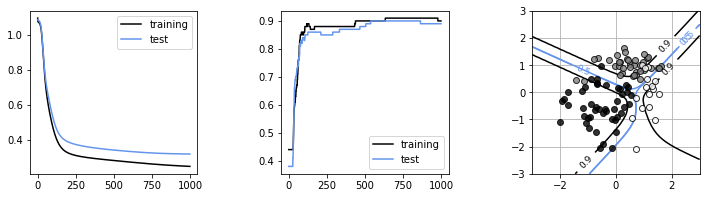

In [38]:
# 리스트 7-2-(4)
plt.figure(1, figsize = (12, 3))
plt.subplots_adjust(wspace=0.5)


# 학습 곡선 표시 --------------------------
plt.subplot(1, 3, 1)
plt.plot(history.history['loss'], 'black', label='training') # (A)
plt.plot(history.history['val_loss'], 'cornflowerblue', label='test') # (B)
plt.legend()


# 정확도 표시 --------------------------
plt.subplot(1, 3, 2)
plt.plot(history.history['accuracy'], 'black', label='training') # (C)
plt.plot(history.history['val_accuracy'], 'cornflowerblue', label='test') # (D)
plt.legend()


# 경계선 표시 --------------------------
plt.subplot(1, 3, 3)
Show_data(X_test, T_test)
xn = 60 # 등고선 표시 해상도
x0 = np.linspace(X_range0[0], X_range0[1], xn)
x1 = np.linspace(X_range1[0], X_range1[1], xn)
xx0, xx1 = np.meshgrid(x0, x1)
x = np.c_[np.reshape(xx0, xn * xn, 'F'), np.reshape(xx1, xn * xn, 'F')]
y = model.predict(x) # (E)
K = 3
for ic in range(K):
    f = y[:, ic]
    f = f.reshape(xn, xn)
    f = f.T
    cont = plt.contour(xx0, xx1, f, levels=[0.5, 0.9], colors=[
        'cornflowerblue', 'black'])
    cont.clabel(fmt='%1.1f', fontsize=9)
    plt.xlim(X_range0)
    plt.ylim(X_range1)
plt.show()

입력 x는 X_train 처럼 데이터를 묶은 행렬로, 출력 또한 이에 대응하는 행렬이 된다.

실행 결과를 보면 훈련 데이터의 오차가 빠르게 감소하는 것을 알 수 있다.

테스트 데이터의 오차도 증가하고 있지 않기 때문에 오버피팅은 일어나지 않았다.

훈련 데이터와 학습 데이터의 정답률을 보면, 학습이 잘 이루어지면 정답률은 1에 다가가는데, 목점 함수와는 다르기 때문에 감소가 일어날 때도 있다.

정답률을 통해 성능을 직관적으로 알 수 있으므로 네트워크의 성능 평과에 자주 사용된다.